핸드폰 사용에 대한 일반적 패턴과 개인적 패턴 구분하기

In [1]:
%%capture
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

In [2]:
import matplotlib as mpl
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
 
!apt -qq -y install fonts-nanum
 
import matplotlib.font_manager as fm
fontpath = '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf'
font = fm.FontProperties(fname=fontpath, size=9)
plt.rc('font', family='NanumBarunGothic') 
#mpl.font_manager._rebuild()

# https://pinkwink.kr/1255 / https://teddylee777.github.io/colab/colab-korean 한글 문제 대응 참고

fonts-nanum is already the newest version (20170925-1).
0 upgraded, 0 newly installed, 0 to remove and 39 not upgraded.


개인적 패턴을 활용하여 personalized channel recommendation 모델 만들기 

## **🔸 DATA OVERVIEW**
- 스마트폰 앱/웹 로그 데이터셋
- Android 6.0.0 이상을 대상으로 UsageStat API를 활용해 수집된 앱 사용 내역
- 31명의 피험자를 대상으로 2018.10월-11월 중 약 3주간 수집됨, 약 158만 건
- json형태로 타임스탬프, 기기, 패키지명, 사용어플명, 타입(포그라운드, 백그라운드) 등에 대한 내용을 담고 있음

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
cd /content/drive/MyDrive/토스

/content/drive/MyDrive/토스


In [6]:
ls

스마트폰_로그_데이터셋2.json  토스분석.csv  스마트폰_로그_데이터셋.json


In [69]:
import json
import time

import datetime
import pandas as pd
import numpy as np
from tqdm import tqdm 
import seaborn as sns
import matplotlib.pyplot as plt

plt.style.use(["seaborn-whitegrid"])
pd.set_option("display.max_rows", 500)
pd.set_option("display.max_columns", 500)

In [8]:
f1 = open("스마트폰_로그_데이터셋.json", encoding="UTF-8")
f2 = open("스마트폰_로그_데이터셋2.json", encoding="UTF-8")

json1 = json.loads(f1.read())
json2 = json.loads(f2.read())

In [9]:
json1[:2]

[{'id': 4,
  'is_system_app': 0,
  'is_updated_system_app': 0,
  'name': 'BAND',
  'package_name': 'com.nhn.android.band',
  'source_info': 'samsung-SM-G928S-7.0',
  'source_type': 'PHONE',
  'subject_id': '2099efc17d719274924b8c81543c7972',
  'timestamp': 1540790989686,
  'type': 'USER_INTERACTION',
  'utcoffset': 9},
 {'id': 7,
  'is_system_app': 0,
  'is_updated_system_app': 0,
  'name': 'BAND',
  'package_name': 'com.nhn.android.band',
  'source_info': 'samsung-SM-G928S-7.0',
  'source_type': 'PHONE',
  'subject_id': '2099efc17d719274924b8c81543c7972',
  'timestamp': 1540790994228,
  'type': 'MOVE_TO_FOREGROUND',
  'utcoffset': 9}]

In [10]:
# pd.DataFrame으로 변경 
df1 = pd.DataFrame(json1)
df1 =  df1.drop(columns=["id"])
df1.head(2)

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type
0,1540790989686,9,2099efc17d719274924b8c81543c7972,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,USER_INTERACTION
1,1540790994228,9,2099efc17d719274924b8c81543c7972,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND


In [11]:
df1.shape

(1588338, 10)

In [12]:
# 데이터 확인 ( 카테고리, 결측치, 타입 )
checking = df1.nunique().to_frame(name="unique")
checking["null"] =df1.isnull().sum()
checking["dtypes"] = df1.dtypes
checking.T

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type
unique,1583089,2,33,1,27,864,833,2,2,6
null,0,0,0,0,0,0,0,0,0,0
dtypes,int64,int64,object,object,object,object,object,int64,int64,object


In [13]:
df1["name"] = df1["name"].replace("微信", "위챗")

In [14]:
# subject_id는 수집 대상 인원을 암호화된 것으로 식별하기 쉽게 0~32로 라벨링을 진행하였습니다. 
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
df1["subject_id"] = encoder.fit_transform(df1["subject_id"])
df1["subject_id"].sort_values().unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32])

timestamp : 핸드폰에서 어플 사용할 때마다 시간이 측정됨  
utc offset : 시간 기준으로 한국에서 사용했는지 해외에서 사용했는지를 나타내는 지표  
subject_id : 실험에 참여한 인원들  
source_type : 핸드폰 앱 사용 기록이므로 핸드폰 1종류만 기재됨    
source_info	: 핸드폰에 대한 상세정보(모델명, 버전)    
package_name : 핸드폰에서 사용한 어플에 대한 경로값 	    
name : 사용한 어플 이름   
is_system_app	: 핸드폰 내에 설치되어 있는 앱  
is_updated_system_app	: 플레이 스토어 등을 통해서 추가적으로 설치된 앱  
type : 사용자가 어떤 행동을 하였는지 기록(대분류로 분류되어 있으나, 사용한 앱에 따라 별도의 분류가 필요할 것으로 사료됨)  

In [15]:
# 해외에서 사용한 이력도 645개로 관찰된다 
df1[["type"]].value_counts().to_frame()

,0
type,
MOVE_TO_FOREGROUND,739388
MOVE_TO_BACKGROUND,737798
USER_INTERACTION,93238
CONFIGURATION_CHANGE,17218
SHORTCUT_INVOCATION,498
NONE,198


MOVE_TO_BACKGROUND과 NONE은 개인의 활동으로 보기는 어려우므로 추후 데이터 정제 시, 해당 컬럼은 제거하도록 하겠습니다. (MOVE_TO_BACKGROUND는 MOVE_TO_FOREGROUND 시, 함께 실행되는 로그 측정 단위라고 생각하시면 됩니다.)

In [16]:
# 해외에서 사용한 이력도 645개로 관찰된다 
df1[["utcoffset"]].value_counts().to_frame().T

utcoffset,9,0
0,1587693,645


In [17]:
# 2, 18번 사용자가 압도적으로 많은 사용량이 관측됨 
print(df1[["subject_id"]].value_counts().to_frame().T)

subject_id      2       18     27     1      25     15     17     20     21  \
0           130600  129091  76989  76904  76860  72934  67326  63364  57593   

subject_id     23     9      6      3      19     12     14     22     0   \
0           57349  57133  51969  51539  51421  50692  47764  43688  41334   

subject_id     4      32     8      26     7      13     11     29     31  \
0           39344  34508  33892  30124  29861  27382  26971  26214  25739   

subject_id     24     28     5      10     16   30  
0           24394  24304  23242  20516  16615  682  


In [18]:
# 핸드폰 취향에 따라서 사용자의 패턴이 달라질 수 있으므로, 큰 카테고리 ( 삼성, LG, google 등)으로 범위화 하고자 함 
df1[["source_info"]].value_counts().to_frame().T

source_info,samsung-SM-G950N-8.0.0,samsung-SM-G930K-8.0.0,Sony-G8141-8.0.0,samsung-SM-G965N-8.0.0,LGE-LG-F800K-8.0.0,samsung-SM-N950N-8.0.0,samsung-SM-G930S-8.0.0,LGE-LGM-V300K-8.0.0,samsung-SM-A710S-7.0,samsung-SM-G960U1-8.0.0,samsung-SM-N920S-7.0,samsung-SM-N910K-6.0.1,samsung-SM-G960N-8.0.0,samsung-SM-G935S-8.0.0,samsung-SM-N960N-8.1.0,samsung-SM-N935S-8.0.0,samsung-SM-N920K-7.0,samsung-SM-G955N-8.0.0,LGE-LGM-G600S-8.0.0,LGE-LG-F700L-8.0.0,samsung-SM-G920S-6.0.1,LGE-LGM-X320L-7.0,samsung-SM-G928S-7.0,samsung-SM-N950N-7.1.1,Xiaomi-Redmi Note 5-8.1.0,Google-Android SDK built for x86-8.1.0,LGE-LGM-G600K-8.0.0
0,196556,141533,130600,130025,129091,118712,88830,72934,67326,57593,50692,47764,41334,39344,38846,34508,33892,30124,26971,26214,24394,20516,19068,16615,4174,645,37


In [19]:
# 해당 데이터는 본 분석에 크게 의미가 있을 것으로 사료되지 않음 
print("총 개수 : ", len(df1[["package_name"]].value_counts()))
print("---")
print("카테고리")
print(df1[["package_name"]].value_counts())

총 개수 :  864
---
카테고리
package_name                 
com.kakao.talk                   427579
com.sec.android.app.launcher     164901
com.twitter.android              151947
kaist.iclab.abc                   50838
com.cashwalk.cashwalk             45289
                                  ...  
com.samsung.android.easysetup         1
com.brainbow.peak.app                 1
com.belugaedu.amgigorae               1
com.photofunia.android                1
com.nhn.android.kin                   1
Length: 864, dtype: int64


In [20]:
burger= df1[(df1["subject_id"] == 27) & (df1["name"] == "Burgerking")]

burger.head(2)

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type
258,1540774092286,9,27,PHONE,samsung-SM-G930K-8.0.0,kr.co.burgerkinghybrid,Burgerking,0,0,MOVE_TO_FOREGROUND
259,1540774092298,9,27,PHONE,samsung-SM-G930K-8.0.0,kr.co.burgerkinghybrid,Burgerking,0,0,MOVE_TO_BACKGROUND


위처럼 핸드폰에서 앱을 시작하면서 변화되는 모든 순간을 시간으로 기록되는 것을 관찰할 수 있습니다. 또한, 0.01초 단위로 로그데이터가 기록되다보니 초단위로 데이터를 살펴보았을 때 중복되는 데이터가 있습니다. 
이러한 데이터들은 중복으로 간주하고 제거해주도록 하겠습니다. 

In [21]:
# 추후 관심있는 앱으로 특징을 더 살펴보도록 하겠습니다. 
df1[(df1["name"] == "토스")].head(2)

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type
19723,1538739342935,9,17,PHONE,samsung-SM-A710S-7.0,viva.republica.toss,토스,0,0,MOVE_TO_FOREGROUND
19724,1538739345545,9,17,PHONE,samsung-SM-A710S-7.0,viva.republica.toss,토스,0,0,MOVE_TO_BACKGROUND


In [22]:
!pip install selenium
!apt-get update
!apt install chromium-chromedriver

     |████████████████████████████████| 911kB 12.5MB/s 
Hit:1 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:2 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:3 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Hit:4 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Get:5 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Get:6 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Get:7 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease [15.9 kB]
Hit:8 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Get:9 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Ign:10 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:11 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:12 https://developer.download.nvidia.com/compute/cuda/repos/ubun

In [23]:
app_list = df1.name.unique()

from selenium import webdriver
from time import sleep
from IPython.display import clear_output

chrome_options = webdriver.ChromeOptions()
chrome_options.add_argument('--headless')
chrome_options.add_argument('--no-sandbox')
chrome_options.add_argument('--disable-dev-shm-usage')
driver = webdriver.Chrome('chromedriver', chrome_options=chrome_options)
driver.implicitly_wait(2)


genre_dict = {}
error_list = []

for i, key_word in enumerate(app_list):
    driver.get('https://play.google.com/store/apps')

    try:
        clear_output()
        print(f'{i+1}/734') #len(app_list) = 734
        driver.find_element_by_xpath('//*[@id="gbqfq"]').send_keys(f'{key_word}' + '\n') #\n을 같이 써줬기에 페이지로 한번에 이동함
        selected_tag_a = driver.find_element_by_xpath('//*[@id="fcxH9b"]/div[4]/c-wiz[2]/div/div[2]/div/c-wiz/c-wiz/c-wiz/div/div[2]/div[1]/c-wiz/div/div/div[1]/div/div/a') #find_element_by_css_selector("input[tabindex='-1']") #
        selected_tag_a.click()
        elements = driver.find_elements_by_css_selector('a[itemprop="genre"]')
        genre_dict[key_word] = elements[0].text

    except:
        clear_output()
        print(f'{i}/734')
        error_list.append(key_word)

833/734


In [24]:
# 수집된 장르 확인 
print("수집된 정상장르 : ", set(genre_dict.values()))
print("---")
print("수집된 에러장르 : ", error_list)

수집된 정상장르 :  {'Tools', 'Personalization', 'Arcade', 'House & Home', 'Adventure', 'Action', 'Finance', 'Auto & Vehicles', 'Shopping', 'Educational', 'Photography', 'Strategy', 'Books & Reference', 'Parenting', 'Dating', 'Food & Drink', 'Education', 'Racing', 'Lifestyle', 'Health & Fitness', 'Sports', 'News & Magazines', 'Simulation', 'Card', 'Casual', 'Music & Audio', 'Video Players & Editors', 'Beauty', 'Weather', 'Entertainment', 'Travel & Local', 'Social', 'Libraries & Demo', 'Art & Design', 'Role Playing', 'Communication', 'Productivity', 'Maps & Navigation', 'Puzzle', 'Business', 'Board', 'Comics'}
---
수집된 에러장르 :  ['KB앱카드', '커피빈멤버스클럽', 'L.pay', 'VIBE', '리디북스', '기본홈(홈&앱서랍)', '爱奇艺HD', 'U+프로야구', 'TubeMate']


In [32]:
# 에러로 빠져서 수집이 되지 않은 경우 직접 genre_dict에 넣어준다. 

genre_dict['리디북스'] = 'Books & Reference'
genre_dict['VIBE'] = 'Music & Audio'
genre_dict['L.pay'] = 'Finance'
genre_dict['KB앱카드'] = 'Finance'
# genre_dict['OP.GG'] = 'Strategy'
genre_dict['커피빈멤버스클럽'] = 'Lifestyle'
genre_dict['퀵툴'] = 'Lifestyle'
genre_dict['기본홈(홈&앱서랍)'] = 'HOME'
genre_dict['爱奇艺HD'] = 'Entertainment'
# genre_dict['GrimTalk'] = 'Puzzle'
genre_dict['호텔나우'] = 'Lifestyle'
genre_dict['U+프로야구'] = 'Sports'
genre_dict['TubeMate'] = 'Video Players & Editors'

'Health & Fitness', 'Educational', 'Video Players & Editors', 'Card'

In [33]:
#정리가 편하도록 대장르를 정리한 뒤 key, value값을 swap해서 매핑

genre_bigcol = {
    'social' : ['Social','Dating'],
    'hobby' : ['Books & Reference','Art & Design','Entertainment','Video',
             'Shopping','Sports','Comics','Photography','Beauty'],
    'self development' : ['Fitness','Education','Educational','Business'],
    'contact' : ['Communication','contact'],
    'tools' : ['Personalization','Tools','HOME','tools'],
    'lifestype' : ['Music & Audio','News & Magazines','Food & Drink','Lifestyle','lifestype', 'Health & Fitness'],
    'producivity' : ['Productivity','House & Home','Auto & Vehicles','Libraries & Demo','Weather',
                     'Travel & Local','Maps & Navigation', 'Finance', 'Card', 'Video Players & Editors'],
    'game' : ['Role Playing', 'Simulation', 'Puzzle', 'Casual', 'Adventure',
           'Racing', 'Action', 'Strategy', 'Parenting', 'Arcade','Board']
}

genre_bigcol = {v:k for k,v_list in genre_bigcol.items() for v in v_list}
genre_bigcol

{'Action': 'game',
 'Adventure': 'game',
 'Arcade': 'game',
 'Art & Design': 'hobby',
 'Auto & Vehicles': 'producivity',
 'Beauty': 'hobby',
 'Board': 'game',
 'Books & Reference': 'hobby',
 'Business': 'self development',
 'Card': 'producivity',
 'Casual': 'game',
 'Comics': 'hobby',
 'Communication': 'contact',
 'Dating': 'social',
 'Education': 'self development',
 'Educational': 'self development',
 'Entertainment': 'hobby',
 'Finance': 'producivity',
 'Fitness': 'self development',
 'Food & Drink': 'lifestype',
 'HOME': 'tools',
 'Health & Fitness': 'lifestype',
 'House & Home': 'producivity',
 'Libraries & Demo': 'producivity',
 'Lifestyle': 'lifestype',
 'Maps & Navigation': 'producivity',
 'Music & Audio': 'lifestype',
 'News & Magazines': 'lifestype',
 'Parenting': 'game',
 'Personalization': 'tools',
 'Photography': 'hobby',
 'Productivity': 'producivity',
 'Puzzle': 'game',
 'Racing': 'game',
 'Role Playing': 'game',
 'Shopping': 'hobby',
 'Simulation': 'game',
 'Social': 's

In [27]:
# # 장르 커스트마이징 
# genre_bigcol = {
#     'social' : ['Social','Dating'],
#     'contact' : ['Communication, 'contact'],
#     'hobby' : ['Books & Reference', 'Art & Design','Entertainment', 'Shopping','Comics','Photography','Beauty', 'Music & Audio','News & Magazines','Food & Drink','Lifestyle','lifestype'],
#     'self development' : ['Fitness', 'Health & Fitness', 'Education',"Educational", 'Business'],
#     'finance' : ['Finance', "Card"],
#     'producivity' : ['Productivity','House & Home','Auto & Vehicles','Libraries & Demo','Weather',
#                      'Travel & Local','Maps & Navigation', 'Personalization', 'Tools', 'HOME', 'tools', "Medical"],
#     'game' : ['Sports', 'Video', 'Video Players & Editors', 'Role Playing', 'Simulation', 'Puzzle', 'Casual', 'Adventure', 'Racing', 'Action', 'Strategy', 'Parenting', 'Arcade','Board']
# }

# genre_bigcol = {v:k for k,v_list in genre_bigcol.items() for v in v_list}
# genre_bigcol

In [34]:
# 장르 딕셔너리를 바탕으로 어플마다 장르를 매칭
df1['genre'] = df1['name'].map(lambda x: genre_dict[x]) 

In [35]:
df1['genre_bigcol'] = df1['genre'].map(lambda x: genre_bigcol[x]) #장르 딕셔너리를 바탕으로 어플마다 장르를 매칭

In [36]:
df1.shape

(1588338, 12)

In [37]:
action = ['MOVE_TO_FOREGROUND', 'USER_INTERACTION', 'SHORTCUT_INVOCATION']
df1_action = df1[df1.type.isin(action)]

In [38]:
# 데이터 pickle로 저장 & 전처리 시간이 매우 오래걸리기 때문에 해당 데이터를 저장해두도록 하겠습니다. 
df1_action.to_csv("토스분석.csv", index=False)

In [39]:
df1_action = pd.read_csv("토스분석.csv")

In [40]:
# 띄워쓰기로 이루어진 공백이 있어서, isnull로는 관측이 안되나, 결측치가 존재하였습니다. 
df1_action.isnull().sum().to_frame().T

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type,genre,genre_bigcol
0,0,0,0,0,0,0,180,0,0,0,0,0


In [41]:
# 위에서 발견된 결측치를 제거하겠습니다. 
df1_action.dropna(inplace=True)

# 결측치를 제거하였기 때문에 인덱스가 틀어지게 되니 이를 바로 잡아주기 위해 reset_index를 진행하였습니다. 
df1_action.reset_index()

# 결측치 확인 
df1_action.isnull().sum().to_frame().T

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type,genre,genre_bigcol
0,0,0,0,0,0,0,0,0,0,0,0,0


In [42]:
df1_action.head(2)

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type,genre,genre_bigcol
0,1540790989686,9,5,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,USER_INTERACTION,Social,social
1,1540790994228,9,5,PHONE,samsung-SM-G928S-7.0,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND,Social,social


In [43]:
df1_action.source_info.value_counts()

samsung-SM-G950N-8.0.0                    102825
samsung-SM-G930K-8.0.0                     73404
Sony-G8141-8.0.0                           67889
samsung-SM-G965N-8.0.0                     67526
LGE-LG-F800K-8.0.0                         66961
samsung-SM-N950N-8.0.0                     62085
samsung-SM-G930S-8.0.0                     46947
LGE-LGM-V300K-8.0.0                        38895
samsung-SM-A710S-7.0                       34923
samsung-SM-G960U1-8.0.0                    30457
samsung-SM-N920S-7.0                       27700
samsung-SM-N910K-6.0.1                     25779
samsung-SM-G960N-8.0.0                     21083
samsung-SM-N960N-8.1.0                     20198
samsung-SM-G935S-8.0.0                     19600
samsung-SM-N935S-8.0.0                     18311
samsung-SM-N920K-7.0                       17864
samsung-SM-G955N-8.0.0                     15662
LGE-LGM-G600S-8.0.0                        14463
LGE-LG-F700L-8.0.0                         14359
samsung-SM-G920S-6.0

In [44]:
df1_action["source_info"][df1_action.source_info.str.contains("samsung")] = "SAMSUNG"
df1_action["source_info"][df1_action.source_info.str.contains("LGE")] = "LG"
df1_action["source_info"][df1_action.source_info.str.contains("Sony")] = "Sony"
df1_action["source_info"][df1_action.source_info.str.contains("Xiaomi")] = "Xiaomi"
df1_action["source_info"][df1_action.source_info.str.contains("Google")] = "Google"

In [45]:
df1_action.source_info.value_counts()

SAMSUNG    616894
LG         145758
Sony        67889
Xiaomi       2069
Google        334
Name: source_info, dtype: int64

In [46]:
df1_action['datetime'] = df1_action['timestamp'].apply(lambda time: datetime.datetime.fromtimestamp(int(time)//1000))
df1_action["date"] = df1_action["datetime"].map(lambda x: x.date())
df1_action["time"] = df1_action["datetime"].map(lambda x: x.time())

In [47]:
df1_action.head(2)

,timestamp,utcoffset,subject_id,source_type,source_info,package_name,name,is_system_app,is_updated_system_app,type,genre,genre_bigcol,datetime,date,time
0,1540790989686,9,5,PHONE,SAMSUNG,com.nhn.android.band,BAND,0,0,USER_INTERACTION,Social,social,2018-10-29 05:29:49,2018-10-29,05:29:49
1,1540790994228,9,5,PHONE,SAMSUNG,com.nhn.android.band,BAND,0,0,MOVE_TO_FOREGROUND,Social,social,2018-10-29 05:29:54,2018-10-29,05:29:54


In [48]:
# 일단 데이터를 해당 실험에 참여한 인원들로 묶어준다. 
# 기존의 index를 record_no라는 이름으로 column을 지정하고 index를 reset을 지정한다. 
# 그리고 set_index로 ['subject_id','date'] 인덱스를 생성한다. 즉, 참여사람별, 날짜 순으로 데이터를 정렬한다. 

df1_action = df1_action.rename_axis('record_no').reset_index()\
            .set_index(['subject_id','date']).sort_index()


# 앱을 시작하는 것과 종료되는 앱의 index를 찾기 위해 빈 set()을 정의합니다. 
l = set()

# 총 33명에 대해서 각각의 앱들을 찾기 위해 먼저 for문을 들고 
# 그 안에서 앱의 개수만큼 for문을 돌면서 시작하는 앱과 마지막 실행된 앱을 찾습니다. 
for i in range(33): 
    person = df1_action.loc[i]
    for v in range(len(person)):
        if v == len(person)-1:
           l.add(person.iloc[v].record_no)
        else:
            if v == 0: 
              l.add(person.iloc[v].record_no)
            if person.iloc[v]['name'] != person.iloc[v+1]['name']:
              l.add(person.iloc[v+1].record_no)

In [49]:
# l set에 저장해둔 index만 남기고 나머지는 모두 정리를 하게 된다. 
df1_action = df1_action[df1_action.record_no.isin(list(l))] 
df1_action

record_no      timestamp  utcoffset source_type  \
subject_id date                                                          
0          2018-10-05     336533  1538735081914          9       PHONE   
           2018-10-05     336534  1538735083907          9       PHONE   
           2018-10-05     336535  1538735088982          9       PHONE   
           2018-10-05     336536  1538735097403          9       PHONE   
           2018-10-05     336538  1538735243265          9       PHONE   
...                          ...            ...        ...         ...   
32         2018-10-20     601445  1540046094548          9       PHONE   
           2018-10-20     601446  1540046095996          9       PHONE   
           2018-10-20     601447  1540046101645          9       PHONE   
           2018-10-20     601450  1540048165449          9       PHONE   
           2018-10-20     601451  1540048909361          9       PHONE   

                      source_info                   package_name  \
subject_id date                                                    
0          2018-10-05     SAMSUNG  com.samsung.android.mateagent   
           2018-10-05     SAMSUNG   com.sec.android.app.launcher   
           2018-10-05     SAMSUNG   net.daum.android.solcalendar   
           2018-10-05     SAMSUNG  com.samsung.android.mateagent   
           2018-10-05     SAMSUNG   net.daum.android.solcalendar   
...                           ...                            ...   
32         2018-10-20     SAMSUNG      com.epicdevs.kaistshuttle   
           2018-10-20     SAMSUNG   com.sec.android.app.launcher   
           2018-10-20     SAMSUNG            com.facebook.katana   
           2018-10-20     SAMSUNG                kaist.iclab.abc   
           2018-10-20     SAMSUNG            com.facebook.katana   

                                         name  is_system_app  \
subject_id date                                                
0          2018-10-05  Samsung Galaxy Friends              1   
           2018-10-05    Samsung Experience 홈              1   
           2018-10-05                    쏠캘린더              0   
           2018-10-05  Samsung Galaxy Friends              1   
           2018-10-05                    쏠캘린더              0   
...                                       ...            ...   
32         2018-10-20                KAIST 셔틀              0   
           2018-10-20    Samsung Experience 홈              1   
           2018-10-20                Facebook              0   
           2018-10-20            ABC Platform              0   
           2018-10-20                Facebook              0   

                       is_updated_system_app                type  \
subject_id date                                                    
0          2018-10-05                      1  MOVE_TO_FOREGROUND   
           2018-10-05                      1  MOVE_TO_FOREGROUND   
           2018-10-05                      0  MOVE_TO_FOREGROUND   
           2018-10-05                      1  MOVE_TO_FOREGROUND   
           2018-10-05                      0  MOVE_TO_FOREGROUND   
...                                      ...                 ...   
32         2018-10-20                      0  MOVE_TO_FOREGROUND   
           2018-10-20                      1  MOVE_TO_FOREGROUND   
           2018-10-20                      0  MOVE_TO_FOREGROUND   
           2018-10-20                      0    USER_INTERACTION   
           2018-10-20                      0  MOVE_TO_FOREGROUND   

                                  genre      genre_bigcol            datetime  \
subject_id date                                                                 
0          2018-10-05             Tools             tools 2018-10-05 10:24:41   
           2018-10-05             Tools             tools 2018-10-05 10:24:43   
           2018-10-05      Productivity       producivity 2018-10-05 10:24:48   
           2018-10-05             Tools             

In [50]:
# 혹시라도 중복된 것들이 제거가 안된 부분이 있는지 확인하기 위해서 drop_duplicate를 진행합니다. 
df1_action.drop_duplicates(keep = 'first', inplace = True)

In [51]:
# shape를 확인합니다. 
df1_action.shape

(377679, 14)

In [52]:
# 사용자가 특정 어플리케이션으로 이동하기 전에 사용한 어플리케이션의 이름 장르 패키지를 보여주는 특성 
df1_action['referrer_package'] = [None] + list(df1_action['package_name'])[:-1]
df1_action['referrer_app'] = [None] + list(df1_action['name'])[:-1]
df1_action['referrer_genre'] = [None] + list(df1_action['genre'])[:-1]

In [53]:
stay_time = []
for i in range(len(df1_action)):
    now = df1_action.iloc[i]
    # 데이터 프레임 있는 맨 마지막 row는 시간을 측정할 수 없기 때문에 None을 넣어준다. 
    # 각 실험참여자의 마지막 staytime은 아래에서 none으로 넣어줄 예정이다. 
    if i == len(df1_action) - 1: stay_time.append(None)
    else:
      next = df1_action.iloc[i+1]
      # 그 외 데이터는 다음 row에서 현재 row의 datetime을 빼서 이용한 시간을 구해준게 된다. 
      stay_time.append(next['datetime'] - now['datetime'])

In [54]:
# stay_time list를 df1_action에 column으로 넣어준다. 
df1_action['stay_time'] = stay_time

In [55]:
# 각 사람마다 referrer_package, referrer_app, referrer_genre의 최초 값은 구할 수가 없기 때문에 None을 넣어준다. 
for i in range(0,33):
    df1_action.at[i,'referrer_package'][0], df1_action.at[i,'referrer_app'][0], df1_action.at[i,'referrer_genre'][0] = None, None, None
    df1_action.at[i, 'stay_time'][-1] = None

In [56]:
# 각 실험 참여자들을 구분하기 위한 의도한 None값들이다. 
df1_action.isna().sum() 

record_no                 0
timestamp                 0
utcoffset                 0
source_type               0
source_info               0
package_name              0
name                      0
is_system_app             0
is_updated_system_app     0
type                      0
genre                     0
genre_bigcol              0
datetime                  0
time                      0
referrer_package         33
referrer_app             33
referrer_genre           33
stay_time                33
dtype: int64

In [57]:
df1_action['total_sec'] = df1_action['stay_time'].map(lambda x: x.total_seconds())

In [58]:
# 톡을 보내거나, 어떠한 정보를 확인하기 위한 최소 사용시간을 5초로 설정 
# 게임을 장시간 할 수 있기 때문에 최대 사용시간을 7시간으로 설정 
df1_action = df1_action[(df1_action.total_sec  >= 5) & (df1_action.stay_time  < "0 days 07:00:00")]
df1_action.head(5)

record_no      timestamp  utcoffset source_type  \
subject_id date                                                          
0          2018-10-05     336534  1538735083907          9       PHONE   
           2018-10-05     336535  1538735088982          9       PHONE   
           2018-10-05     336536  1538735097403          9       PHONE   
           2018-10-05     336540  1538735248321          9       PHONE   
           2018-10-05     336541  1538735292201          9       PHONE   

                      source_info                   package_name  \
subject_id date                                                    
0          2018-10-05     SAMSUNG   com.sec.android.app.launcher   
           2018-10-05     SAMSUNG   net.daum.android.solcalendar   
           2018-10-05     SAMSUNG  com.samsung.android.mateagent   
           2018-10-05     SAMSUNG   com.sec.android.app.sbrowser   
           2018-10-05     SAMSUNG  com.samsung.android.mateagent   

                                         name  is_system_app  \
subject_id date                                                
0          2018-10-05    Samsung Experience 홈              1   
           2018-10-05                    쏠캘린더              0   
           2018-10-05  Samsung Galaxy Friends              1   
           2018-10-05                  삼성 인터넷              0   
           2018-10-05  Samsung Galaxy Friends              1   

                       is_updated_system_app                type  \
subject_id date                                                    
0          2018-10-05                      1  MOVE_TO_FOREGROUND   
           2018-10-05                      0  MOVE_TO_FOREGROUND   
           2018-10-05                      1  MOVE_TO_FOREGROUND   
           2018-10-05                      0  MOVE_TO_FOREGROUND   
           2018-10-05                      1  MOVE_TO_FOREGROUND   

                               genre genre_bigcol            datetime  \
subject_id date                                                         
0          2018-10-05          Tools        tools 2018-10-05 10:24:43   
           2018-10-05   Productivity  producivity 2018-10-05 10:24:48   
           2018-10-05          Tools        tools 2018-10-05 10:24:57   
           2018-10-05  Communication      contact 2018-10-05 10:27:28   
           2018-10-05          Tools        tools 2018-10-05 10:28:12   

                           time               referrer_package  \
subject_id date                                                  
0          2018-10-05  10:24:43  com.samsung.android.mateagent   
           2018-10-05  10:24:48   com.sec.android.app.launcher   
           2018-10-05  10:24:57   net.daum.android.solcalendar   
           2018-10-05  10:27:28   com.sec.android.app.launcher   
           2018-10-05  10:28:12   com.sec.android.app.sbrowser   

                                 referrer_app referrer_genre       stay_time  \
subject_id date                                                                
0          2018-10-05  Samsung Galaxy Friends          Tools 0 days 00:00:05   
           2018-10-05    Samsung Experience 홈          Tools 0 days 00:00:09   
           2018-10-05                    쏠캘린더   Productivity 0 days 00:02:26   
           2018-10-05    Samsung Experience 홈          Tools 0 days 00:00:44   
           2018-10-05                  삼성 인터넷  Communication 0 days 00:01:06   

                       total_sec  
subject_id date                   
0          2018-10-05        5.0  
           2018-10-05        9.0  
           2018-10-05      146.0  
           2018-10-05       44.0  
           2018-10-05       66.0

In [59]:
df1_action.shape

(187671, 19)

In [60]:
data = df1_action.reset_index()
data.shape

(187671, 21)

In [61]:
# 데이터 pickle로 저장 & 전처리 시간이 매우 오래걸리기 때문에 해당 데이터를 저장해두도록 하겠습니다. 
data.to_csv("토스분석.csv", index=False)

### 데이터 전처리가 장시간 걸리므로 별도로 저장을 하고 진행하였습니다.

In [62]:
# import warnings
# warnings.filterwarnings("ignore")

# from google.colab import drive
# drive.mount('/content/drive')

# cd /content/drive/MyDrive/토스

# import json
# import time

# import datetime
# import pandas as pd
# import numpy as np
# from tqdm import tqdm 
# import seaborn as sns
# import matplotlib.pyplot as plt

# pd.set_option("display.max_rows", 500)
# pd.set_option("display.max_columns", 500)

# data = pd.read_csv("토스분석.csv")

# df1_action = data.set_index(['subject_id','date']).sort_index()

In [63]:
df1_action.head(2)

record_no      timestamp  utcoffset source_type  \
subject_id date                                                          
0          2018-10-05     336534  1538735083907          9       PHONE   
           2018-10-05     336535  1538735088982          9       PHONE   

                      source_info                  package_name  \
subject_id date                                                   
0          2018-10-05     SAMSUNG  com.sec.android.app.launcher   
           2018-10-05     SAMSUNG  net.daum.android.solcalendar   

                                       name  is_system_app  \
subject_id date                                              
0          2018-10-05  Samsung Experience 홈              1   
           2018-10-05                  쏠캘린더              0   

                       is_updated_system_app                type  \
subject_id date                                                    
0          2018-10-05                      1  MOVE_TO_FOREGROUND   
           2018-10-05                      0  MOVE_TO_FOREGROUND   

                              genre genre_bigcol            datetime  \
subject_id date                                                        
0          2018-10-05         Tools        tools 2018-10-05 10:24:43   
           2018-10-05  Productivity  producivity 2018-10-05 10:24:48   

                           time               referrer_package  \
subject_id date                                                  
0          2018-10-05  10:24:43  com.samsung.android.mateagent   
           2018-10-05  10:24:48   com.sec.android.app.launcher   

                                 referrer_app referrer_genre       stay_time  \
subject_id date                                                                
0          2018-10-05  Samsung Galaxy Friends          Tools 0 days 00:00:05   
           2018-10-05    Samsung Experience 홈          Tools 0 days 00:00:09   

                       total_sec  
subject_id date                   
0          2018-10-05        5.0  
           2018-10-05        9.0

In [64]:
set_df1_action = df1_action.drop(columns= ["referrer_package", "is_system_app",	"is_updated_system_app",	"package_name", "source_type", "utcoffset"])
set_df1_action.head(2)

record_no      timestamp source_info  \
subject_id date                                               
0          2018-10-05     336534  1538735083907     SAMSUNG   
           2018-10-05     336535  1538735088982     SAMSUNG   

                                       name                type         genre  \
subject_id date                                                                 
0          2018-10-05  Samsung Experience 홈  MOVE_TO_FOREGROUND         Tools   
           2018-10-05                  쏠캘린더  MOVE_TO_FOREGROUND  Productivity   

                      genre_bigcol            datetime      time  \
subject_id date                                                    
0          2018-10-05        tools 2018-10-05 10:24:43  10:24:43   
           2018-10-05  producivity 2018-10-05 10:24:48  10:24:48   

                                 referrer_app referrer_genre       stay_time  \
subject_id date                                                                
0          2018-10-05  Samsung Galaxy Friends          Tools 0 days 00:00:05   
           2018-10-05    Samsung Experience 홈          Tools 0 days 00:00:09   

                       total_sec  
subject_id date                   
0          2018-10-05        5.0  
           2018-10-05        9.0

In [65]:
how_many_wakeup = []
for i in range(33):
    if i!=30: #id 30번은 기록이 거의 없어 포함시 평균이 정확하지 않게 측정이 이루어집니다. 이에, 제외토록 하겠습니다. 
        how_many_wakeup.append(set_df1_action.loc[i].groupby('date').count()[0:-1].mean())

In [66]:
np.array(how_many_wakeup).mean()

265.73756264824095

In [67]:
df1_action.total_sec.mean()

298.99668036084427

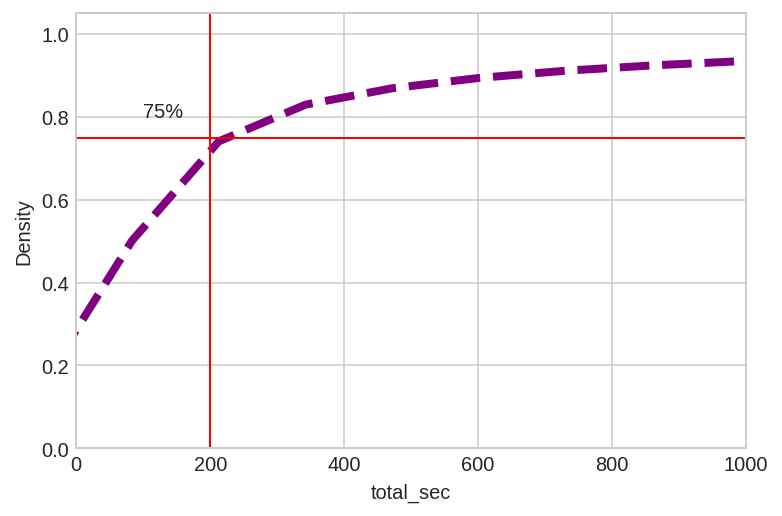

In [70]:
# kdeplot : kernel density estimation 
# density estimation(밀도추정) : (관측된) 데이터들의 분포로부터 원래 변수의 (확률) 분포 특성을 추정하고자 하는 것
# 그러나, 우리가 데이터에 대한 사전 정보를 아는 것은 거의 없기 때문에 사전 정보나 지식 없이 순수하게 관측된 데이터만으로 확률밀도함수를 추정해야 하는데 이를 non-parametric density estimation라 부른다.
# non-parametric density estimation의 대표적인 예가 히스토그램인데 히스토그램은 아래와 같이 3가지의 단점이 있다. 
# 1) bin의 경계에서 불연속성이 나타난다는 점, 
# 2) bin의 크기 및 시작 위치에 따라서 히스토그램이 달라진다는 점, 
# 3) 고차원(high dimension) 데이터에는 메모리 문제 등으로 사용하기 힘들다는 점 등의 문제점을 갖는다.
# 이러한 문제점을 해결하기 위한 그래프가 kdeplot이다. 
# 즉KDE(Kernel Density Estimation)를 통해 얻은 확률밀도함수는 히스토그램 확률밀도함수를 스무딩(smoothing)한 것이 kdeplot이다. 

plt.xlim(0,1000)
plt.text(100, 0.8, '75%')
sns.kdeplot(df1_action['total_sec'], cumulative=True, color = 'purple', linewidth=4, linestyle='--');
plt.axhline(0.75, linewidth = 1, color = 'red');
plt.axvline(200, linewidth = 1, color = 'red');

plt.show()

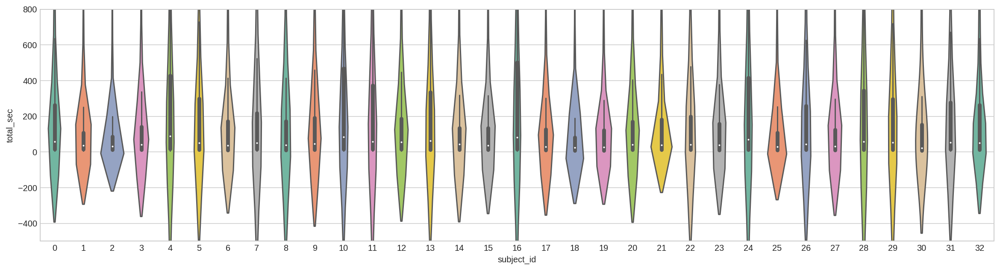

In [71]:
plt.figure(figsize=(20,5))

plt.ylim(-500,800)
sns.violinplot(x = 'subject_id', y='total_sec', data = df1_action.reset_index(), palette="Set2");

plt.show()

In [72]:
# 일부 앱이 크롤링이 잘못되어 직접 수정을 진행하였습니다. 

df1_action["genre"][df1_action.name.str.contains("Melon")] = "Music & Audio"
df1_action["genre_bigcol"][df1_action.name.str.contains("Melon")] = "lifestype"

df1_action["genre"][df1_action.name.str.contains("삼성 인터넷")] = "Productivity"
df1_action["genre_bigcol"][df1_action.name.str.contains("삼성 인터넷")] = "producivity"

df1_action["genre"][df1_action.name.str.contains("Chrome")] = "Productivity"
df1_action["genre_bigcol"][df1_action.name.str.contains("Chrome")] = "producivity"

df1_action["genre"][df1_action.name.str.contains("다음")] = "Productivity"
df1_action["genre_bigcol"][df1_action.name.str.contains("다음")] = "producivity"

df1_action["genre"][df1_action.name.str.contains("검은사막 모바일")] = "Role Playing"
df1_action["genre_bigcol"][df1_action.name.str.contains("검은사막 모바일")] = "game"

df1_action["genre"][df1_action.name.str.contains("YouTube")] = "Video"
df1_action["genre_bigcol"][df1_action.name.str.contains("YouTube")] = "hobby"

In [73]:
top_ap = df1_action.groupby(['genre_bigcol','name'])['total_sec'].agg(['count','mean'])
top_ap['mean'] = top_ap['mean'].map(lambda x: time.strftime('%H:%M:%S', time.gmtime(x)))
top_ap.sort_values('count', ascending=False).head(10).groupby(level=0).head().sort_index(ascending=False)

count      mean
genre_bigcol     name                                 
tools            TouchWiz 홈             4608  00:06:30
                 Samsung Experience 홈  19200  00:05:39
social           트위터                    7223  00:02:42
                 Facebook               4693  00:03:51
self development ABC Platform           9188  00:05:16
producivity      삼성 인터넷                 4859  00:04:53
                 Chrome                 6389  00:03:54
lifestype        캐시워크                   8737  00:10:32
contact          카카오톡                  32330  00:03:24
                 메시지                    4761  00:04:42

In [74]:
top_ap[top_ap['count'] >= 100].sort_values('mean', ascending=False).head(10).groupby(level=0).head().sort_index()

count      mean
genre_bigcol     name                                      
game             벽람항로                         473  00:12:23
hobby            AfreecaTV                    184  00:12:40
lifestype        CJ ONE                       258  00:16:47
                 Mi 피트                        481  00:12:10
producivity      알람/시간                        126  00:37:01
                 알람/시계                        378  00:12:05
self development 시계                          1687  00:11:09
social           위베어베어스 더퍼즐                   169  00:13:14
tools            AhnLab V3 Mobile Security    204  00:12:30
                 기본홈(홈&앱서랍)                   768  00:12:59

In [75]:
from collections import Counter

app_pt = Counter()
genre_pt = Counter()

a_pat = list(zip(set_df1_action['referrer_app'],set_df1_action['name']))
g_pat = list(zip(set_df1_action['referrer_genre'], set_df1_action['genre']))

app_pt.update(a_pat)
genre_pt.update(g_pat)

In [76]:
app_pt.most_common(10)

[(('Samsung Experience 홈', '카카오톡'), 9439),
 (('카카오톡', 'Samsung Experience 홈'), 5756),
 (('모아락', '캐시워크'), 2324),
 (('시스템 UI', '카카오톡'), 2273),
 (('허니스크린', '캐시워크'), 2064),
 (('ABC Platform', '카카오톡'), 2051),
 (('Samsung Experience 홈', 'NAVER'), 1989),
 (('Samsung Experience 홈', 'Instagram'), 1891),
 (('Samsung Experience 홈', '삼성 인터넷'), 1836),
 (('원더락', '캐시워크'), 1694)]

In [77]:
genre_pt.most_common(10)

[(('Tools', 'Communication'), 18311),
 (('Personalization', 'Communication'), 13082),
 (('Communication', 'Tools'), 9609),
 (('Tools', 'Social'), 7447),
 (('Personalization', 'Social'), 6761),
 (('Tools', 'Tools'), 4845),
 (('Communication', 'Communication'), 4747),
 (('Communication', 'Personalization'), 4616),
 (('Health & Fitness', 'Communication'), 4522),
 (('Lifestyle', 'Health & Fitness'), 4320)]

In [78]:
genre_pt_1000 = genre_pt.most_common(100)

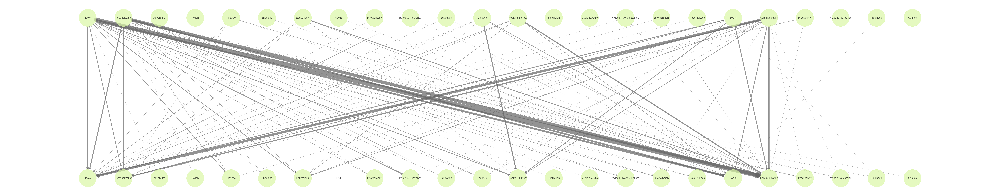

In [79]:
import networkx as nx
import numpy as np

plt.figure(figsize=(125,25))

G1_keys = set([k[0] for k, _ in genre_pt_1000 if all(k) is True])
G2_keys = set([k[1] for k, _ in genre_pt_1000 if all(k) is True])
G_keys = G1_keys.union(G2_keys)
num_keys = len(G_keys)
G_mapping = {k: v for v, k in enumerate(G_keys)}
G_rev_mapping = {k: v for k, v in enumerate(G_keys)}

edge_list = []
for edge, weight in genre_pt_1000:
    if all(edge) is False: continue
    mapped_edge = (G_mapping[edge[0]], G_mapping[edge[1]] + num_keys, weight)
    edge_list.append(mapped_edge)

node_labels = {k: v for k, v in G_rev_mapping.items()}
node_labels.update({k + num_keys: v for k, v in G_rev_mapping.items()})

DG = nx.DiGraph()

DG.add_weighted_edges_from(edge_list)
DG.add_nodes_from([k for k in G_rev_mapping.keys()])

pos = {}
for node in node_labels.keys():
    x_spacing = np.linspace(-0.8, 0.8, num_keys)
    x = x_spacing[node] if node < num_keys else x_spacing[node - num_keys]
    y = 0.5 if node < num_keys else -0.5
    pos[node] = (x, y)

edge_width = [DG[u][v]['weight'] for u, v in DG.edges()]
normalized_edge_width = [30 * width / max(edge_width) for width in edge_width]

# plt.figure(1, figsize=(24, 8))
graph = nx.draw_networkx(DG, pos,
                         alpha=0.7,
                         with_labels=True, width=normalized_edge_width,
                         edge_color='.4', node_color = '#DAF7A6', node_size=15000, labels=node_labels, font_size = 18,
                         arrowstyle='->,head_width=0.6,head_length=0.5')

In [80]:
app_pt_100 = app_pt.most_common(100)

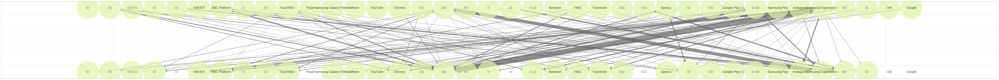

In [100]:
rc('font', family='NanumBarunGothic') 
plt.figure(figsize=(100,8))

G1_keys = set([k[0] for k, _ in app_pt_100 if all(k) is True])
G2_keys = set([k[1] for k, _ in app_pt_100 if all(k) is True])
G_keys = G1_keys.union(G2_keys)
num_keys = len(G_keys)
G_mapping = {k: v for v, k in enumerate(G_keys)}
G_rev_mapping = {k: v for k, v in enumerate(G_keys)}

edge_list = []
for edge, weight in app_pt_100:
    if all(edge) is False: continue
    mapped_edge = (G_mapping[edge[0]], G_mapping[edge[1]] + num_keys, weight)
    edge_list.append(mapped_edge)

node_labels = {k: v for k, v in G_rev_mapping.items()}
node_labels.update({k + num_keys: v for k, v in G_rev_mapping.items()})

DG = nx.DiGraph()

DG.add_weighted_edges_from(edge_list)
DG.add_nodes_from([k for k in G_rev_mapping.keys()])

pos = {}
for node in node_labels.keys():
    x_spacing = np.linspace(-0.8, 0.8, num_keys)
    x = x_spacing[node] if node < num_keys else x_spacing[node - num_keys]
    y = 0.5 if node < num_keys else -0.5
    pos[node] = (x, y)

edge_width = [DG[u][v]['weight'] for u, v in DG.edges()]
normalized_edge_width = [30 * width / max(edge_width) for width in edge_width]

plt.figure(1, figsize=(24, 8))
graph = nx.draw_networkx(DG, pos,
                         alpha=0.7,
                         with_labels=True, width=normalized_edge_width,
                         edge_color='.4', node_color = '#DAF7A6', node_size=15000, labels=node_labels, font_size = 18,
                         arrowstyle='->,head_width=0.6,head_length=0.5')

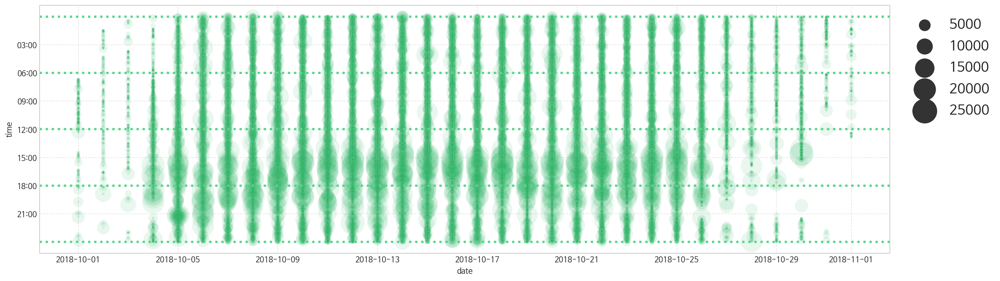

In [106]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
rc('font', family='NanumBarunGothic') 
fig, ax = plt.subplots(figsize = (20,6))

pd.plotting.register_matplotlib_converters()

dt = df1_action.reset_index()[['date','time','total_sec','subject_id']]
# dt = dt.sort_values(by="date", ascending=True)
# dt["time"] = pd.to_datetime(dt["time"])

x = dt.date
y = dt.time
size = dt.total_sec
ytick = [f'{x}:00' for x in range(3,24,3)]
timepoints = ['00:01','06:00','12:00','18:00','23:59']

sns.scatterplot(x = x, y = y, size = size, sizes = (10,1000), alpha = 0.1, color = '#28B463')
plt.grid(True, alpha = 0.5, linestyle = '--')

# plt.xticks(fontsize = 15)
plt.yticks(ytick)

plt.legend(bbox_to_anchor=(1.01, 1), loc=2, prop={'size': 18})
for tp in timepoints: plt.axhline(tp, color = '#58D68D', linewidth = 3, linestyle = ':')
plt.show();

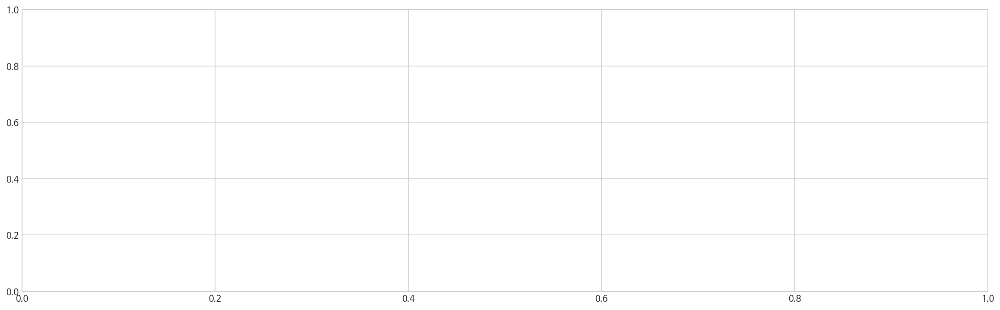

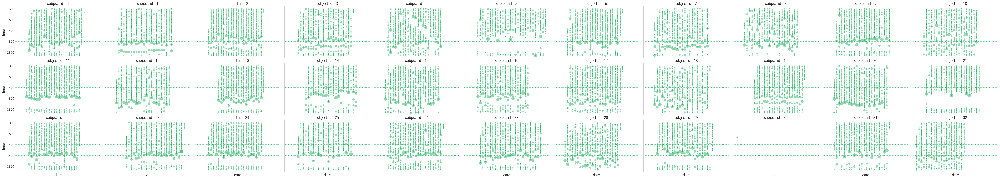

In [107]:
pd.plotting.register_matplotlib_converters()


dt = df1_action.reset_index()[['date','time','total_sec','subject_id']]

g = sns.FacetGrid(dt, col = 'subject_id', col_wrap = 11, aspect = 1.5)
g.map(sns.scatterplot, "date", "time", size = size, sizes = (5,150), color = '#28B463', alpha = 0.5)
ytick = [f'{x}:00' if x!= 24 else '23:00' for x in range(-6,25,6)]

plt.grid(True)
plt.xticks([])
g.fig.subplots_adjust(wspace=.05, hspace=.1)

for ax in g.axes.flat:
    ax.set_title(ax.get_title(), fontsize='large')
    ax.set_xlabel(ax.get_xlabel(), fontsize='large')
    ax.set_ylabel(ax.get_ylabel(), fontsize='large')
    ax.set_yticklabels(ytick, fontsize='medium')
    ax.grid(color='#28B463', linestyle=':', linewidth= 0.5)

In [ ]:
from matplotlib import rc
rc('font',family='AppleGothic')

pd.plotting.register_matplotlib_converters()

palette = sns.color_palette("Set2",4)
ytick = [f'{x}:00' for x in range(3,24,3)]

df = df1_action.loc[27]

for v in ['name','genre','genre_bigcol']:
    if v == 'name':
        plt.figure(figsize=(30,10));
        plt.xticks(rotation=80, fontsize=8);
        sns.scatterplot(x= v, y = 'time', size = 'total_sec', alpha = 0.5, sizes = (100,2000),
                        data=df, palette= palette, legend = False);
    else:
        plt.figure(figsize=(7,5));
        sns.scatterplot(x= v, y = 'time', size = 'total_sec', alpha = 0.7, sizes = (10,1000),
                        data=df, palette= palette, legend = False);
        plt.xticks(rotation=75)
        
    plt.yticks(ytick)
    plt.title(f'Cluster by < {v.upper()} >')
    plt.xlabel([])
    plt.show();

In [ ]:
fig = plt.figure(figsize=(66,22))
axes = fig.subplots(nrows=3, ncols=11)

handles = []
labels = df1_action.genre_bigcol.unique()

for i in range(33):
    col = i // 3
    row = i % 3
    
    df = df1_action.loc[i]
    g = sns.histplot(df, x='date', hue='genre_bigcol', ax= axes[row, col], legend = False);
    handles.append(g)

fig.legend(labels, loc="upper right", bbox_to_anchor=[0.935, 0.88], shadow=True, fancybox=True)

plt.show()

In [86]:
my_freq = df1_action.groupby(['subject_id'])['name'].value_counts(normalize=True)
all_freq = df1_action['name'].value_counts(normalize=True)

def cal_importance(row):
    
    pid = row['subject_id']
    app_name = row['name']
    stay_time = row['total_sec']
    my_impt, all_impt = my_freq.loc[pid][app_name], all_freq[app_name]
    importance = round(my_impt / all_impt, 2)
    importance = importance*(stay_time/60) 
    return importance

In [87]:
df1_action['importance'] = list(df1_action.reset_index().apply(cal_importance, axis=1))

In [88]:
df1_action.importance.max()

20844.085166666668

In [89]:
def importance_detector(rows):
    time = rows.total_sec
    importance = rows.importance
    
    if (time >= 300) & (importance > 3): return 4
    elif time >= 300: return 3
    elif importance > 3: return 2
    else: return 1

In [90]:
df1_action['importance_cat'] = list(df1_action.apply(importance_detector, axis=1))

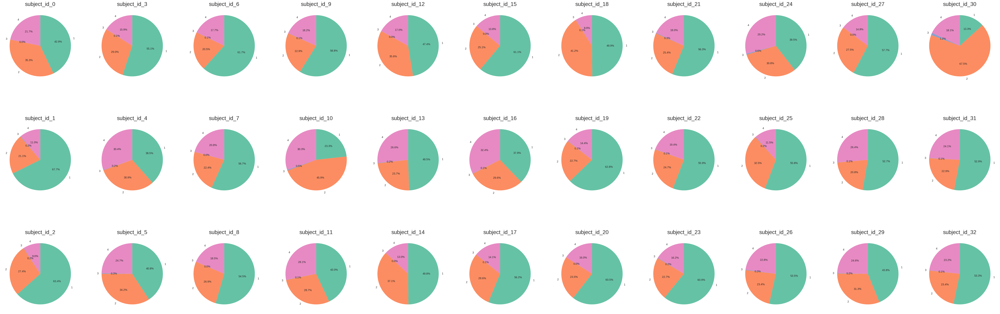

In [91]:
pie_df = pd.DataFrame(df1_action.groupby('subject_id')['importance_cat'].value_counts(normalize=True)).sort_index(level=(0,1)).rename(columns = {'importance_cat':'ratio'})


fig = plt.figure(figsize=(66,22))
axes = fig.subplots(nrows=3, ncols=11)

handles = []
labels = df1_action.genre.unique()
pal = sns.color_palette("Set2", 4)

for i in range(33):
    col = i // 3
    row = i % 3
    
    df = pie_df.loc[i]
    axes[row,col].pie(df['ratio'], labels= df.index, startangle=90, counterclock=False, colors = pal,  autopct='%1.1f%%', textprops={'fontsize':10});
    axes[row,col].set_title(f'subject_id_{i}', fontsize=20)
    

plt.show()

In [92]:
df1_action.groupby('importance_cat')['total_sec'].agg(['mean','count'])

,mean,count
importance_cat,,
1,27.738478,101827
2,109.847095,52719
3,466.445693,267
4,1441.746607,32858


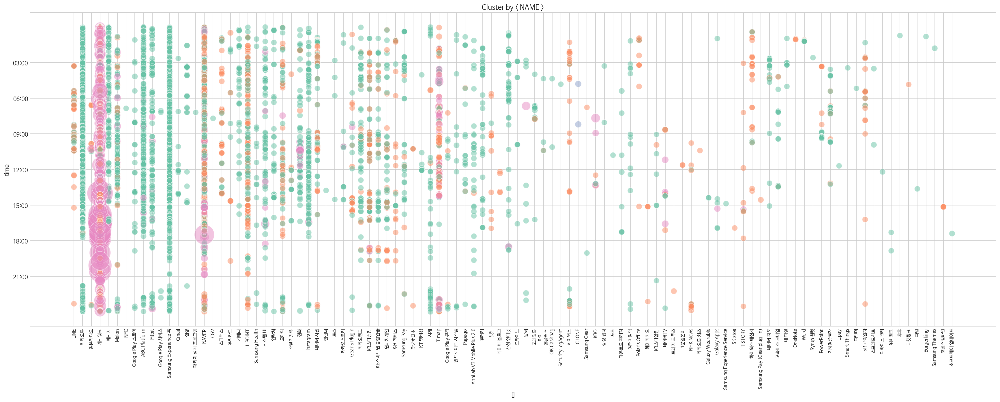

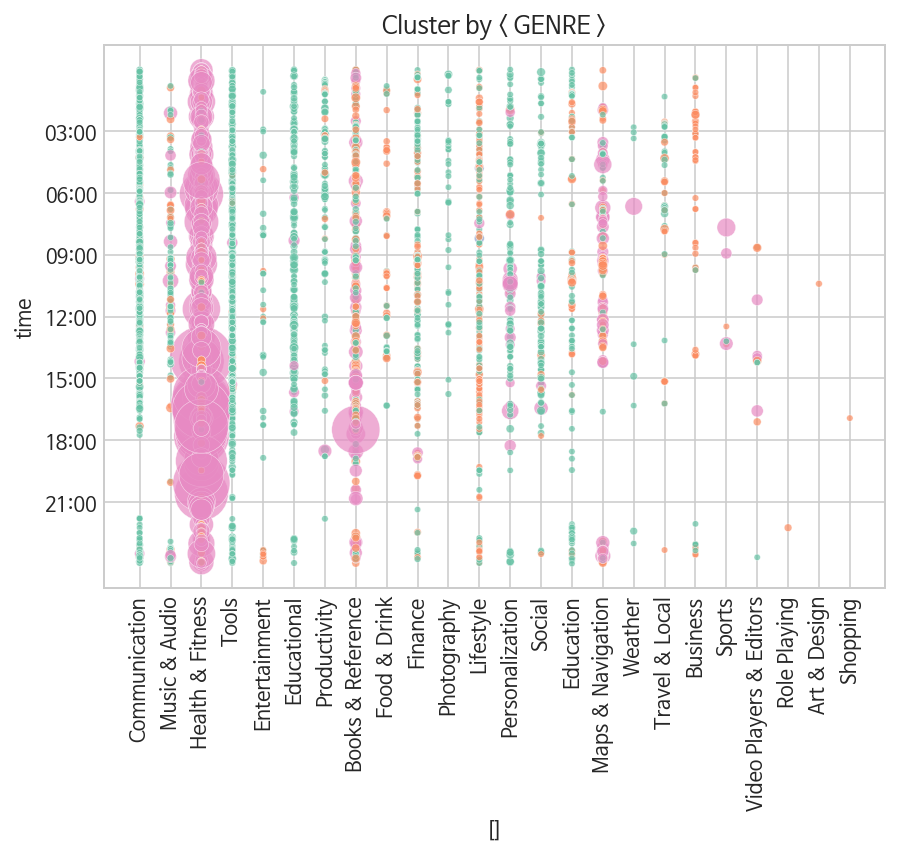

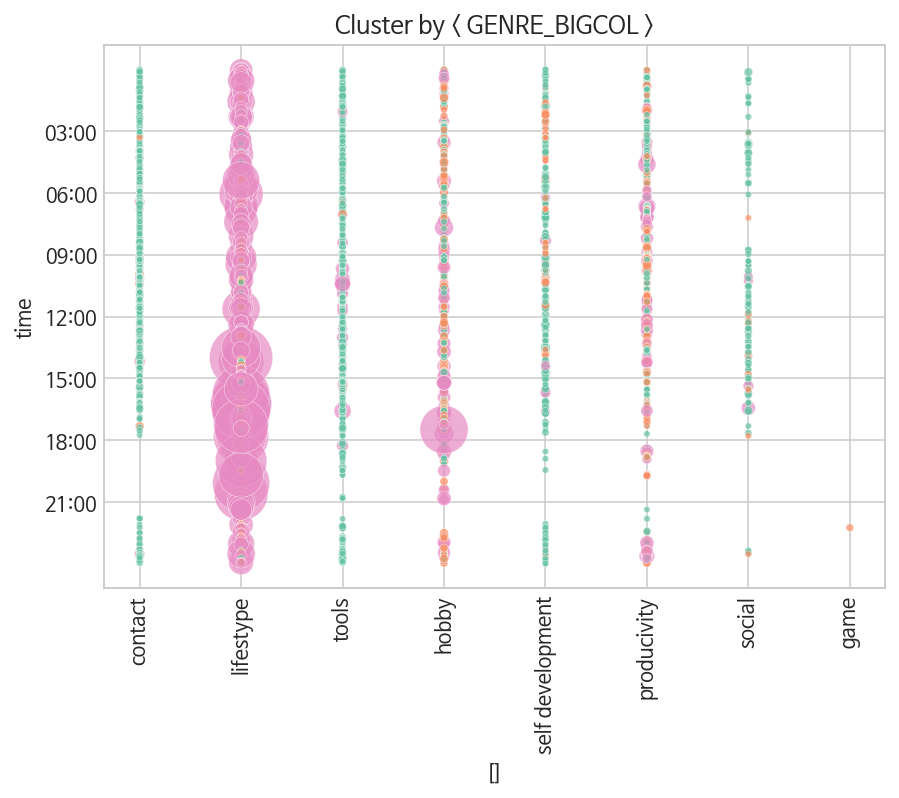

In [109]:
from matplotlib import rc
rc('font', family='NanumBarunGothic') 

pd.plotting.register_matplotlib_converters()

palette = sns.color_palette("Set2",4)
ytick = [f'{x}:00' for x in range(3,24,3)]

df = df1_action.loc[27]

for v in ['name','genre','genre_bigcol']:
    if v == 'name':
        plt.figure(figsize=(30,10));
        plt.xticks(rotation=90, fontsize=8);
        sns.scatterplot(x= v, y = 'time', size = 'total_sec', hue='importance_cat', alpha = 0.5, sizes = (100,2000),
                        data=df, palette= palette, legend = False);
    else:
        plt.figure(figsize=(7,5));
        sns.scatterplot(x= v, y = 'time', size = 'total_sec', hue='importance_cat', alpha = 0.7, sizes = (10,1000),
                        data=df, palette= palette, legend = False);
        plt.xticks(rotation=90)
        
    plt.yticks(ytick)
    plt.title(f'Cluster by < {v.upper()} >')
    plt.xlabel([])
    plt.show();